In [1]:
# Check GPU detection and CUDA setup
!nvidia-smi

# Verify CUDA availability and configuration
import torch
print(f'PyTorch version: {torch.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')

if torch.cuda.is_available():
    print(f'CUDA version: {torch.version.cuda}')
    print(f'cuDNN version: {torch.backends.cudnn.version() if torch.backends.cudnn.is_available() else "Not available"}')
    print(f'Number of GPUs: {torch.cuda.device_count()}')
    for i in range(torch.cuda.device_count()):
        print(f'GPU {i}: {torch.cuda.get_device_name(i)}')
    print(f'Current GPU: {torch.cuda.current_device()}')
    
    # Test GPU with a small tensor operation
    x = torch.rand(10, 10).cuda()
    y = torch.rand(10, 10).cuda()
    z = x @ y  # Matrix multiplication
    print(f'Test tensor device: {z.device}')
else:
    print("CUDA is not available. Training will be on CPU only, which will be much slower.")
    print("To enable GPU, install the appropriate NVIDIA drivers and CUDA toolkit.")

Sun Sep 14 13:27:24 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.33                 Driver Version: 546.33       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1060      WDDM  | 00000000:02:00.0 Off |                  N/A |
| N/A   34C    P0              23W /  69W |      0MiB /  6144MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# DepthAI Tutorial: Training and deployment of a YoloV8 model (Local Storage)

![](https://img.shields.io/badge/DepthAI-2.28.0.0-lightgrey) ![](https://img.shields.io/badge/OpenVINO-2022.1-blue)

Welcome to DepthAI!

This tutorial will guide you through training and deploying a YoloV8 model for object detection, with all data and results stored locally on your machine. You can rerun or restart the notebook at any time without relying on Colab or Google Drive mounts.

The tutorial covers:
* Setting up a local project directory
* Cloning the Ultralytics repository locally
* Installing dependencies
* Preparing and downloading a dataset locally
* Training a YoloV8 model on a custom dataset
* Resuming training if you rerun the notebook
* Validating the trained model
* Performing inference locally
* Converting the model to a blob file for DepthAI devices using [tools.luxonis.com](http://tools.luxonis.com)

*Note:* In this tutorial, we will use a custom dataset. You will need to prepare your dataset in YOLO format and have a corresponding YAML file.

## Project Setup

Set your local project directory and ensure it exists on disk.

In [2]:
import os

# Set the base path for your project locally
DRIVE_PATH = os.getcwd()
print(f"Project path: {DRIVE_PATH}")

# Create the project directory if it doesn't exist
os.makedirs(DRIVE_PATH, exist_ok=True)

Project path: c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training


## Clone and Install Ultralytics

Clone the Ultralytics repository into your local project directory (if not already present) and install its dependencies.

In [3]:
import os

# Clone the Ultralytics repository locally
ultralytics_path = os.path.join(DRIVE_PATH, "ultralytics")
if not os.path.isdir(ultralytics_path):
    print(f"Cloning Ultralytics repository to {ultralytics_path}")
    os.system(f'git clone https://github.com/ultralytics/ultralytics "{ultralytics_path}"')
else:
    print(f"Repository already exists at {ultralytics_path}, skipping clone.")

print(f"Changing working directory to {ultralytics_path}")
os.chdir(ultralytics_path)

# Install Ultralytics dependencies
print("Installing Ultralytics dependencies...")
get_ipython().run_line_magic('pip', 'install -qe .')
print("Ultralytics dependency installation completed.")

Cloning Ultralytics repository to c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\ultralytics
Changing working directory to c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\ultralytics
Installing Ultralytics dependencies...
Note: you may need to restart the kernel to use updated packages.
Ultralytics dependency installation completed.


## Dataset Preparation and Download

Prepare your dataset locally in YOLO format with images and labels, and download it via Roboflow (or use an existing local dataset).

*Note: Replace the Roboflow API key and project details with your own.*

In [4]:
!pip install roboflow --quiet

from roboflow import Roboflow
import os
import shutil

# Replace with your Roboflow API key and project details
rf = Roboflow(api_key="Yg0BQvifINgpEz0Z2JI3")
project = rf.workspace("egh455-tblnn").project("my-egh455-tjdpe")
version = project.version(13)

# Local path where the dataset lives
target_dataset_path = os.path.join(DRIVE_PATH, "dataset")

if os.path.isdir(target_dataset_path):
    print(f"Dataset already exists at {target_dataset_path}. Skipping download.")
else:
    print(f"Downloading dataset to {target_dataset_path}...")
    dataset = version.download("yolov8")
    shutil.move(dataset.location, target_dataset_path)
    print(f"Dataset downloaded to {target_dataset_path}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to My-EGH455-13 in yolov8:: 100%|██████████| 5778/5778 [00:06<00:00, 899.94it/s] 


Dataset downloaded to c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset


## Training

Before we begin the training, we have to choose the pretrained model. This image from YoloV8 documentation quickly summarizes them. You can find more about the models [here](https://github.com/ultralytics/ultralytics#models).

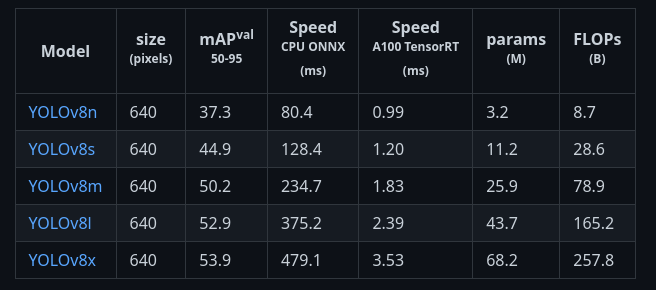

Select a YoloV8n as it is small and relatively quick for the OAK-D Lite. You can also experiment with heavier models, but it might affect the FPS on Oak-D devices or cause it to crash due to out-of-memory errors.

## Start Training
Train YOLOv8 for a specified number of epochs. Results are saved to local runs folder.

In [5]:
!yolo task=detect mode=train model=yolov8n.pt data="{target_dataset_path}/data.yaml" epochs=500 imgsz=640 plots=True save=True save_period=5 batch=0.7 cache=True device=0 project="runs/detect" name=train


Ultralytics 8.3.199  Python-3.11.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=0.7, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=500, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, o

### Resuming Training

If the training process is interrupted, you can resume it from the last saved checkpoint by setting `resume=True` flag in the training command below.

In [ ]:
model_path = os.path.join(DRIVE_PATH, "ultralytics", "runs", "detect", "train", "weights")

!yolo task=detect mode=train model="{model_path}/last.pt" data="{target_dataset_path}/data.yaml" epochs=500 imgsz=640 plots=True save=True save_period=5 batch=0.7 cache=True device=0 project="runs/detect" name=train resume=True

Ultralytics 8.3.199  Python-3.11.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=0.7, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\ultralytics\runs\detect\train\weights\

Check some results:

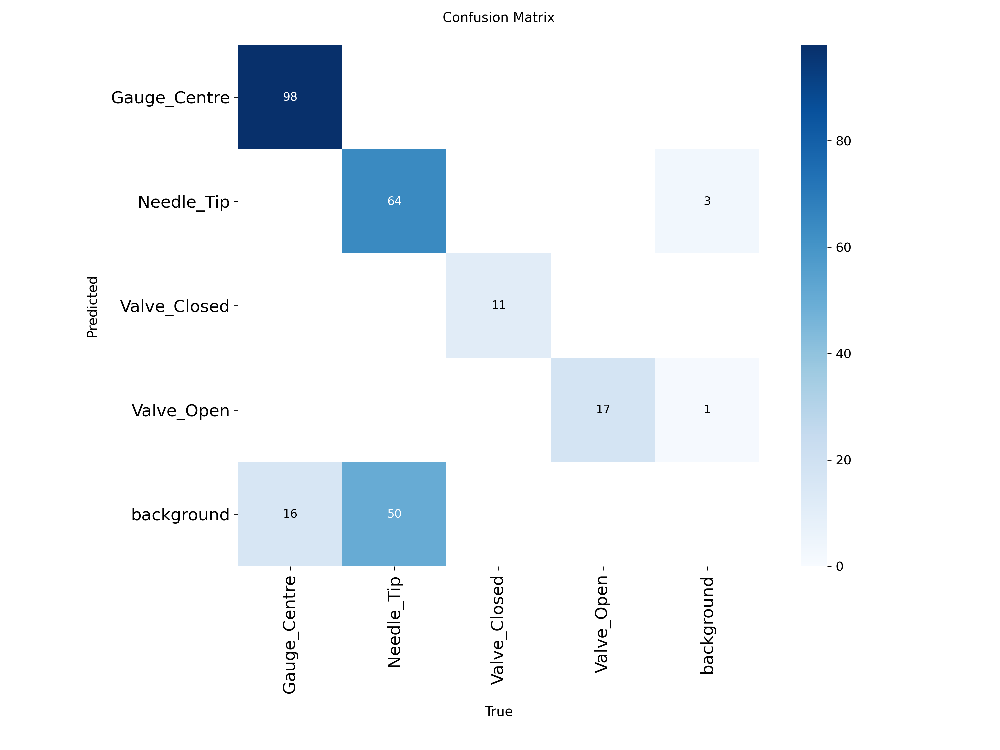

In [6]:
from IPython.display import Image
Image(filename=f'{DRIVE_PATH}/ultralytics/runs/detect/train/confusion_matrix.png', width=600)

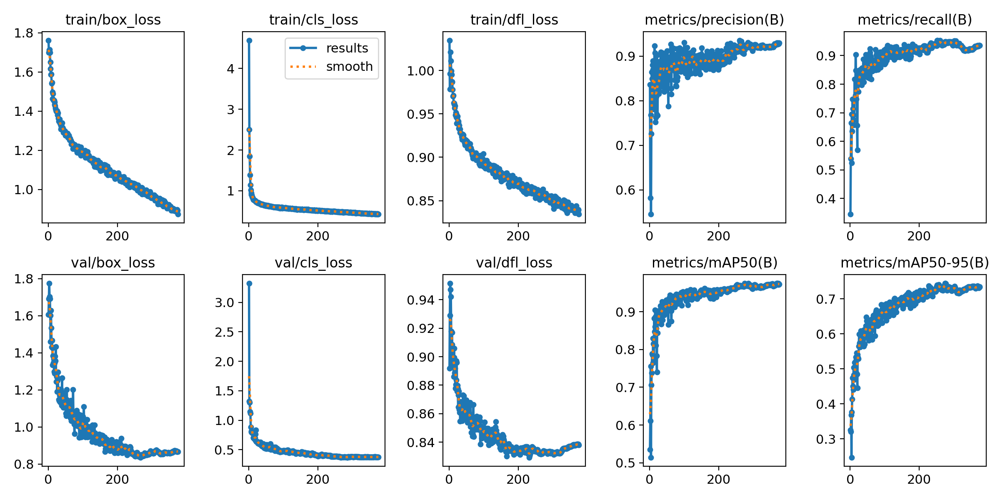

In [7]:
Image(filename=f'{DRIVE_PATH}/ultralytics/runs/detect/train/results.png', width=600)

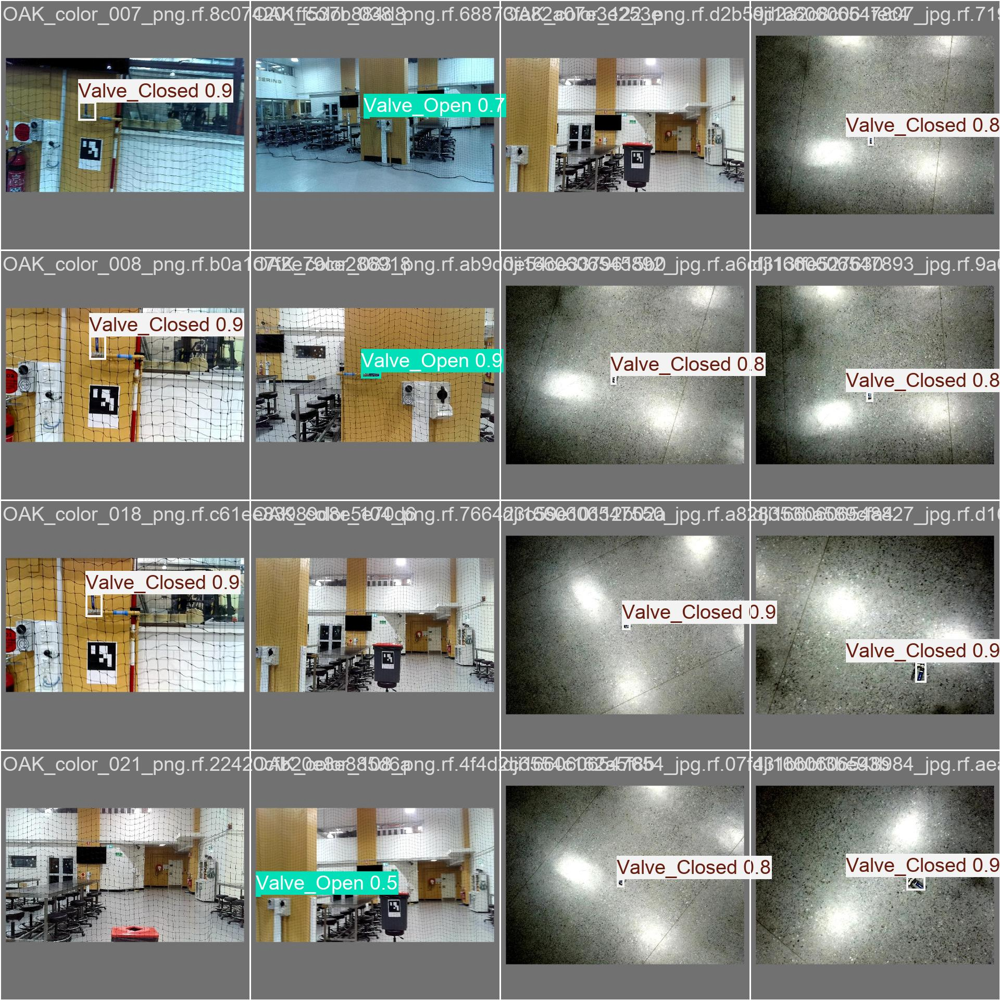

In [8]:
Image(filename=f'{DRIVE_PATH}/ultralytics/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validation

After training our model, we can validate it on the validation set of our dataset.

In [9]:
%cd {DRIVE_PATH}/ultralytics

!yolo task=detect mode=val model="{DRIVE_PATH}/ultralytics/runs/detect/train/weights/best.pt" data="{target_dataset_path}/data.yaml"

c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\ultralytics


Ultralytics 8.3.199  Python-3.11.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 53.122.1 MB/s, size: 49.2 KB)

val: Scanning C:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\valid\labels.cache... 157 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 157/157  0.0s
val: Scanning C:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\valid\labels.cache... 157 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 157/157 156.6Kit/s 0.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 1/10 0.3it/s 1.0s<31.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 20% ━━────────── 2/10 1.3it/s 1.3s<6.1s
                 Class     Images  Instances      Box(P          R      mAP50  

## Inference

Perform inference on the test set using the trained model. The results will be saved to your Google Drive.

Script provided for training the model has a lot of settable parameters which you can see in [here](https://docs.ultralytics.com/cfg/#training).

We will set *task* to detect for object detection and image size *imgsz* to 640.
We will train the model with a *batch* size that utilises 70% of the GPU for 300 *epochs*.
We set *data* to data.yaml and choose the small version.
We set *device* to 0 to utilise the GPU.

For real training, *epochs* should typically be between 300-1000 epochs.

If training gets interrupted, we can add the *resume=True* flag to resume from last checkpoint.

In [ ]:
!yolo task=detect mode=predict model="{DRIVE_PATH}/ultralytics/runs/detect/train/weights/best.pt" conf=0.25 source="{target_dataset_path}/test/images" save=True project="{DRIVE_PATH}/ultralytics/runs/detect" name=predict

c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\ultralytics
Ultralytics 8.3.199  Python-3.11.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs

image 1/71 c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\test\images\OAK_color_016_png.rf.cf5af7f7e9e2b3396faaad72564433b3.jpg: 384x640 1 Valve_Closed, 92.6ms
image 2/71 c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\test\images\OAK_color_062_png.rf.ac0438b25a09c43a6cbe1ec204c1b5f5.jpg: 384x640 1 Valve_Open, 14.7ms
image 3/71 c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\test\images\OAK_color_066_png.rf.8c44d78df1a5cbed22bf8682e1ce0e16.jpg: 384x640 1 Gauge_Centre, 1 Valve_Open, 15.4ms
image 4/71 c:\Users\ncart\OneDrive\QUT\EGH455 Advanced Systems Design\EGH455\models\training\dataset\test\im

### Check 5 random inference results

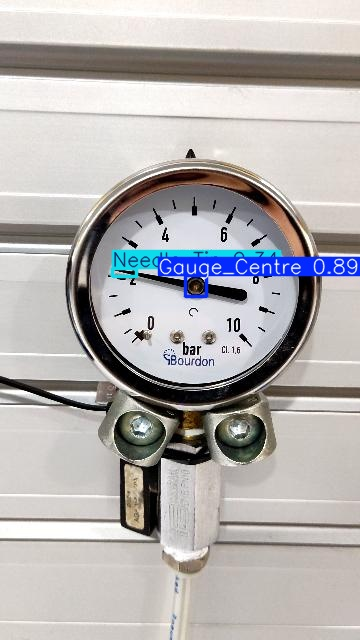

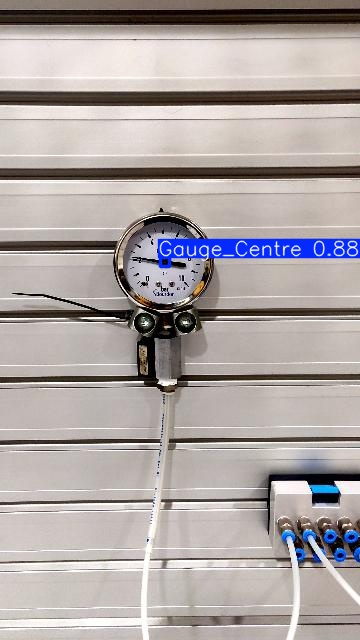

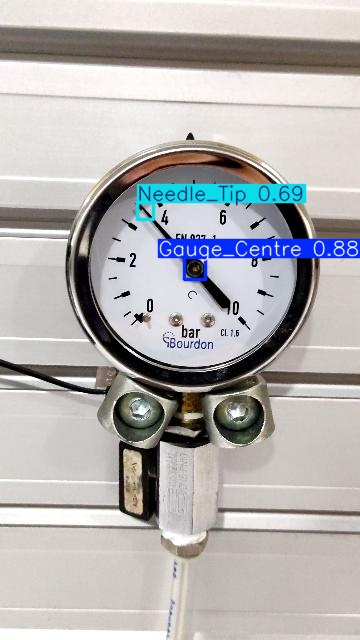

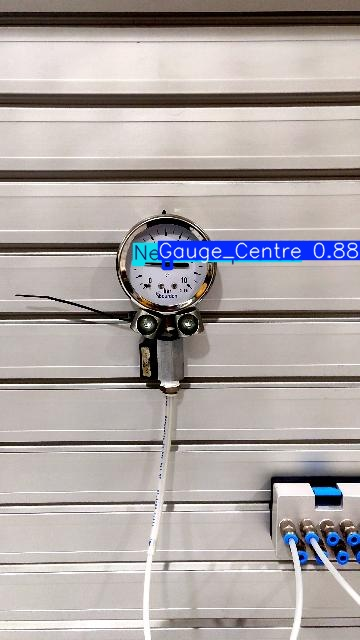

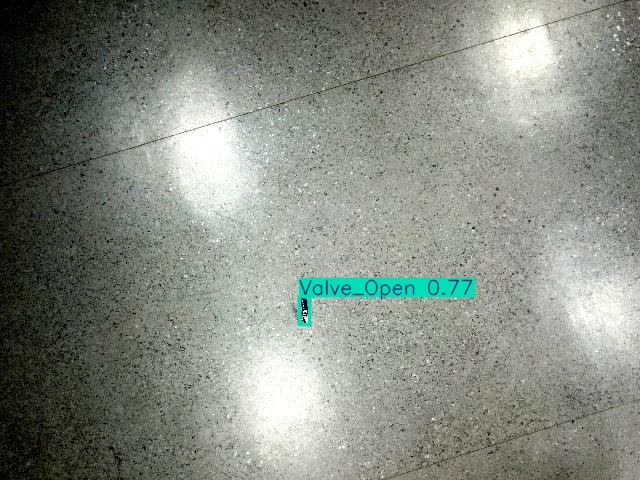

In [13]:
import glob
from IPython.display import Image, display
import os
import random  # Add this import for random sampling

# Define the base path where inference results are stored locally
base_path = os.path.join(os.getcwd(), 'runs', 'detect')

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
if subfolders:
    latest_folder = max(subfolders, key=os.path.getmtime)

    # Get all image paths
    image_paths = glob.glob(os.path.join(latest_folder, '*.jpg'))
    
    # Randomly select 5 images (or less if there are fewer than 5 images)
    num_images = min(5, len(image_paths))
    random_images = random.sample(image_paths, num_images)

    # Display each randomly selected image
    if random_images:
        for image_path in random_images:
            display(Image(filename=image_path, width=600))
            print("\n")
    else:
        print(f"No .jpg images found in the latest prediction folder: {latest_folder}")
else:
    print(f"No prediction results found in {base_path}. Please run the inference step first.")

## Rename and Download Trained Weights

Rename the best trained weights file (\ultralytics\runs\detect\train\weights\best.pt):

best.pt -> YOLOv8n.pt

## Generating the .blob file using [tools.luxonis.com](http://tools.luxonis.com)
After the training and validation, you can convert the fine-tuned PyTorch model to a `.blob` format.

Please follow these steps to do so:
1.   Download the fine-tuned weights from `runs/detect/train/weights/yolov8s.pt` to your device
2.   Go to the page [tools.luxonis.com](http://tools.luxonis.com)
3.   On the page set Yolo Version to `YoloV8 (detection only)` ( (as shown in the screeenshot below)
4.   On the page set File to the downloaded `yolov8s` weights (as shown in the screeenshot below)
5.   On the page set Input shape to `640` (as shown in the screeenshot below)



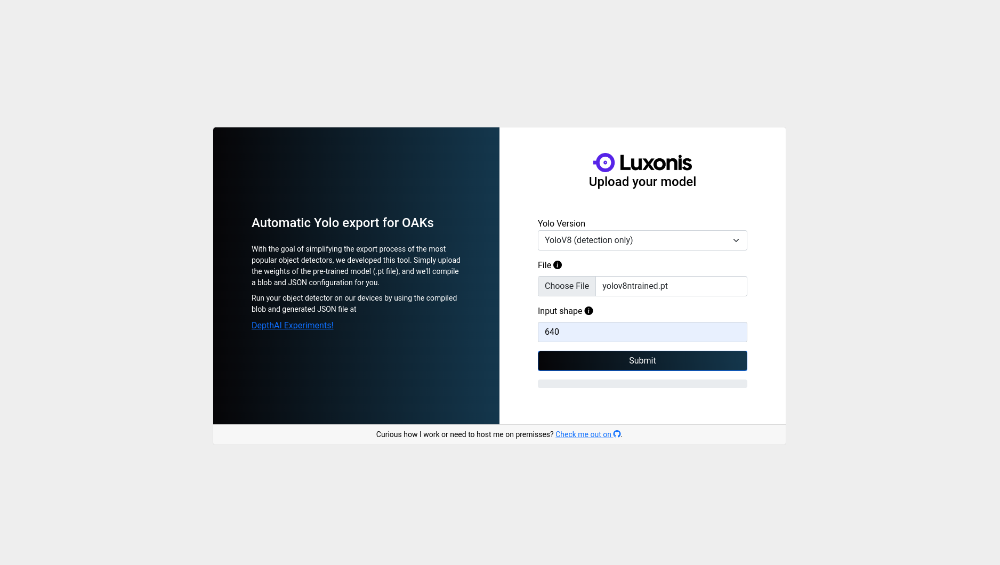

### Next steps

After the tool converts the model to the `blob`, it will compress the converted `blob` file alongside a corresponding `JSON` config file and intermediate `ONNX` and `OpenVINO` representations and automatically download the compressed folder.

The `JSON` config file contains the following parameters:
* *input_size* - input shape of the model,
* *num_classes* - number of classes that Yolo can detect,
* *coordinates* - the size of coordinates *(4 by default)*,
* *anchors* - Yolo anchors,
* *iou_threshold* - intersection over union threshold,
* *confidence_threshold* - confidence threshold above which objects are detected,
* *anchor_masks* - set the anchor masks as described in the next section,
* *labels* - labels of the objects that Yolo can detect.

To run the converted blob on an OAK device with on-device encoding, please visit the [depthai-experiments/gen2-yolo/device-decoding](https://github.com/luxonis/depthai-experiments/tree/master/gen2-yolo/device-decoding) repository. We provide the instructions in the README folder.


1.   Clone the repository using `git clone git@github.com:luxonis/depthai-experiments.git`
2.   Go to the `depthai-experiments/gen2-yolo/device-decoding/` folder
3.   Install the required dependencies using `python3 -m pip install -r requirements.txt`
     
     **Note: For the YoloV8 models to work properly, you have to use the DepthAI library in version `2.18.0.0` or newer! To update the DepthAI library use this command: `pip install depthai --upgrade`.**
4.   Extract the downloaded folder and move the files to the `depthai-experiments/gen2-yolo/device-decoding/` folder
5.   Run the app using `python3 main.py --config yolov8ntrained.json`